In [1]:
%config Completer.use_jedi = False

In [2]:
import pandas as pd
import numpy as np
import math
import glob
from datetime import datetime
from datetime import timedelta
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.metrics import ConfusionMatrixDisplay

In [3]:
# Caminhos dos diretórios raiz
# general_path = 'C:/Users/cnalm/OneDrive/Hidroweb'
# general_path = 'D:/Dados_Nuvem/OneDrive/Hidroweb'
general_path = r'C:\Users\linde\OneDrive\Hidroweb'
cemaden_path = r'C:\Users\linde\OneDrive\CEMADEN'

In [4]:
def absolute_quality_label(row):
    if row['quality_label'] in ['High Quality']:
        return 'HQ'
    elif row['quality_label'] in ['Low Quality']:
        return 'LQ'
    else:
        return 'Unknown'

# PROCESSAMENTO REALIZADO

In [24]:
df_cemaden_daily = pd.read_hdf(general_path + '/Consolidated Files/BRASIL_CEMADEN_TOTAL_DAILY.h5','table_data')
df_cemaden_daily['year'] = df_cemaden_daily['date'].dt.year
df_cemaden_daily = df_cemaden_daily[df_cemaden_daily['rain_mm'] >= 0.0]
df_cemaden_daily = df_cemaden_daily[df_cemaden_daily['year'] <= 2020]
# FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER 
# df_cemaden_daily = df_cemaden_daily[df_cemaden_daily['year'] == 2014]
# df_cemaden_daily = df_cemaden_daily[df_cemaden_daily['gauge_code'] == '355700601A']
# df_cemaden_daily = df_cemaden_daily[df_cemaden_daily['code_prefix'] == '12']
# FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER FILTER 
df_cemaden_daily

,gauge_code,date,rain_mm,year
0,120010401A,2018-08-14,0.2,2018
1,120010401A,2018-08-15,37.4,2018
2,120010401A,2018-08-16,0.2,2018
3,120010401A,2018-08-17,0.0,2018
4,120010401A,2018-08-18,0.0,2018
...,...,...,...,...
9273568,CEMADEN_14,2019-04-26,0.0,2019
9273569,CEMADEN_14,2019-04-27,0.0,2019
9273570,CEMADEN_14,2019-04-28,0.0,2019
9273571,CEMADEN_14,2019-04-29,6.2,2019


In [25]:
years = df_cemaden_daily['year'].sort_values(ascending=True).drop_duplicates().values.tolist()
years

[2014, 2015, 2016, 2017, 2018, 2019, 2020]

In [26]:
len(df_cemaden_daily['gauge_code'].drop_duplicates().values.tolist())

4178

## P

In [27]:
def calculateP(df):
    station_list = df['gauge_code'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
    df_result = pd.DataFrame(columns = ["gauge_code", "year", "p_availability"])
    count = 0
    for station in station_list:
        count = count + 1
        print(count, '/', len(station_list))
        list_gauge_code = []
        list_year = []
        list_p_availabity = []
        df_temp_station = df[(df['gauge_code'] == station)]
        year_list = df_temp_station['year'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
        for year in year_list:
            df_temp_station_year = df_temp_station[(df_temp_station['year'] == year)]
            first_day = datetime(year, 1, 1)
            last_day = datetime(year + 1, 1, 1)
            year_length = (last_day - first_day).days
            row_count = len(df_temp_station_year)
            yearly_availabity = row_count / year_length * 100.0
            list_gauge_code.append(station)
            list_year.append(year)
            list_p_availabity.append(yearly_availabity)
        df_station_availabity = pd.DataFrame(list(zip(list_gauge_code, list_year, list_p_availabity)), columns =['gauge_code', 'year', 'p_availability'])
        if df_result.empty:
            df_result = df_station_availabity.copy(deep=True)
        else:
            df_result = pd.concat([df_result, df_station_availabity], ignore_index = True)
    return df_result

In [28]:
df_p = calculateP(df_cemaden_daily)
df_p.to_hdf(general_path + '/Quality/CEMADEN/V2/CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_p_availability.h5', 'table_data', mode = 'w', append = False, complevel = 9, encoding="cp860")
df_p

1 / 4178
2 / 4178
3 / 4178
4 / 4178
5 / 4178
6 / 4178
7 / 4178
8 / 4178
9 / 4178
10 / 4178
11 / 4178
12 / 4178
13 / 4178
14 / 4178
15 / 4178
16 / 4178
17 / 4178
18 / 4178
19 / 4178
20 / 4178
21 / 4178
22 / 4178
23 / 4178
24 / 4178
25 / 4178
26 / 4178
27 / 4178
28 / 4178
29 / 4178
30 / 4178
31 / 4178
32 / 4178
33 / 4178
34 / 4178
35 / 4178
36 / 4178
37 / 4178
38 / 4178
39 / 4178
40 / 4178
41 / 4178
42 / 4178
43 / 4178
44 / 4178
45 / 4178
46 / 4178
47 / 4178
48 / 4178
49 / 4178
50 / 4178
51 / 4178
52 / 4178
53 / 4178
54 / 4178
55 / 4178
56 / 4178
57 / 4178
58 / 4178
59 / 4178
60 / 4178
61 / 4178
62 / 4178
63 / 4178
64 / 4178
65 / 4178
66 / 4178
67 / 4178
68 / 4178
69 / 4178
70 / 4178
71 / 4178
72 / 4178


KeyboardInterrupt: 

In [ ]:
del df_p

## Q1

In [ ]:
def calculateQ1(df):
    station_list = df['gauge_code'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
    df_result = pd.DataFrame(columns = ["gauge_code", "year", "q1_gaps"])
    count = 0
    for station in station_list:
        count = count + 1
        print(count, '/', len(station_list))
        list_gauge_code = []
        list_year = []
        list_q1_gaps = []
        df_temp_station = df[(df['gauge_code'] == station)]
        year_list = df_temp_station['year'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
        for year in year_list:
            # print(station, year)
            df_temp_station_year = df_temp_station[(df_temp_station['year'] == year)]
            min_date = min(df_temp_station_year['date'])
            max_date = max(df_temp_station_year['date'])
            first_day = datetime(year, 1, 1)
            last_day = datetime(year + 1, 1, 1)
            date_list = []
            today = first_day
            while today < last_day:
                date_list.append(today)
                today = today + timedelta(days=1)
            df_date_list = pd.DataFrame(date_list, columns=['date'])
            count_ops = len(df_date_list)
            df_date_list = df_date_list[(df_date_list['date'] >= min_date) & (df_date_list['date'] <= max_date)]
            df_analysis = df_date_list.merge(df_temp_station_year, how = 'left', on  = 'date')
            df_analysis = df_analysis.sort_values(['date'], ignore_index=True)
            df_void = df_analysis[(df_analysis['rain_mm'].isnull())]
            df_void = df_void.sort_values(['date'], ignore_index=True)
            count_gaps = len(df_void)
            gap_series = df_analysis['rain_mm'].values.tolist()
            gap_count = 0
            gap_max_len = 0
            for value in gap_series:
                if math.isnan(value):
                    gap_count = gap_count + 1
#                     print(value, "gap count is", gap_count)
                    if gap_count > gap_max_len:
                        gap_max_len = gap_count
#                         print(value, "new gap max len", gap_max_len)
                else:
                    gap_count = 0
#                     print(value, "gap count is zero", gap_count)
            # print("count_gaps", count_gaps)
            # print("count_ops", count_ops)
            # print("gap_max_len", gap_max_len)
            q_gap = 100.0 - 100.0 * (((2.0 * count_gaps) + gap_max_len)/count_ops)
            if (q_gap < 0.0):
                q_gap = 0.0
            print("q_gap", q_gap)
            list_gauge_code.append(station)
            list_year.append(year)
            list_q1_gaps.append(q_gap)
        df_station_gaps = pd.DataFrame(list(zip(list_gauge_code, list_year, list_q1_gaps)), columns =['gauge_code', 'year', 'q1_gaps'])
        if df_result.empty:
            df_result = df_station_gaps.copy(deep=True)
        else:
            df_result = pd.concat([df_result, df_station_gaps], ignore_index = True)
    return df_result

In [ ]:
df_q1 = calculateQ1(df_cemaden_daily)
df_q1.to_hdf(general_path + '/Quality/CEMADEN/V2/CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_q1_gaps.h5', 'table_data', mode = 'w', append = False, complevel = 9, encoding="cp860")
df_q1

1 / 4178
q_gap 100.0
q_gap 92.32876712328768
q_gap 100.0
2 / 4178
q_gap 98.35616438356165
q_gap 41.64383561643835
q_gap 2.7322404371584668
3 / 4178
q_gap 100.0
q_gap 81.91780821917808
q_gap 100.0
q_gap 100.0
q_gap 100.0
4 / 4178
q_gap 100.0
q_gap 100.0
q_gap 100.0
5 / 4178
q_gap 100.0
q_gap 62.02185792349727
6 / 4178
q_gap 100.0
q_gap 100.0
7 / 4178
q_gap 100.0
q_gap 92.6027397260274
q_gap 100.0
8 / 4178
q_gap 100.0
q_gap 100.0
q_gap 100.0
9 / 4178
q_gap 100.0
q_gap 97.53424657534246
q_gap 100.0
10 / 4178
q_gap 100.0
q_gap 85.47945205479452
q_gap 0.0
11 / 4178
q_gap 100.0
q_gap 85.20547945205479
q_gap 0.0
12 / 4178
q_gap 97.26027397260275
q_gap 86.84931506849315
q_gap 100.0
13 / 4178
q_gap 99.17808219178082
q_gap 84.65753424657534
q_gap 100.0
14 / 4178
q_gap 100.0
15 / 4178
q_gap 100.0
q_gap 89.58904109589041
q_gap 100.0
16 / 4178
q_gap 82.46575342465754
q_gap 97.8082191780822
q_gap 100.0
17 / 4178
q_gap 100.0
q_gap 98.08219178082192
q_gap 100.0
18 / 4178
q_gap 100.0
q_gap 97.808219178

C:\Users\linde\AppData\Local\Temp\ipykernel_30392\4089258966.py:2: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df_q1.to_hdf(general_path + '/Quality/CEMADEN/V2/CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_q1_gaps.h5', 'table_data', mode = 'w', append = False, complevel = 9, encoding="cp860")


,gauge_code,year,q1_gaps
0,120010401A,2018,100.000000
1,120010401A,2019,92.328767
2,120010401A,2020,100.000000
3,120032801A,2018,98.356164
4,120032801A,2019,41.643836
...,...,...,...
22768,CEMADEN_12,2019,100.000000
22769,CEMADEN_12,2020,100.000000
22770,CEMADEN_13,2019,94.794521
22771,CEMADEN_14,2018,100.000000


In [ ]:
del df_q1

## Q2

In [ ]:
def calculateQ2(df):
    """
    Description:
    This function calculates a metric (q2_weekday) related to rainy days for each unique combination of gauges and years in the provided DataFrame (df).
    The metric represents the variation in the count of rainy days across weekdays.

    Parameters:
    df (DataFrame): The input DataFrame containing relevant data, including columns such as 'gauge_code', 'year', 'date', 'rain_mm', etc.
    
    Output:
    df_result (DataFrame): A new DataFrame containing columns 'gauge_code', 'year', and 'q2_weekday' with calculated values.
    
    Algorithm:
    1. Extract unique gauge codes from the provided DataFrame.
    2. Initialize an empty DataFrame to store the calculated results.
    3. Iterate over each unique gauge code:
    3.1. For each gauge code, iterate over each unique year.
    3.2. Calculate the variation in rainy days (q2_weekday) for each weekday.
    3.3. Compile the results into a new DataFrame.
    3.4. Concatenate this DataFrame with the main result DataFrame.
    4. Return the final DataFrame (df_result) with calculated values.
    """
    station_list = df['gauge_code'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
    df_result = pd.DataFrame(columns = ["gauge_code", "year", "q2_weekday"])
    count = 0
    for station in station_list[:]:
        count = count + 1
        print("\n", count, '/', len(station_list))
        list_gauge_code = []
        list_year = []
        list_q5_test= []
        df_temp_station = df[(df['gauge_code'] == station)]
        year_list = df_temp_station['year'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
        for year in year_list:
            # print(station, year)
            df_temp_station_year = df_temp_station[(df_temp_station['year'] == year)]
            # count_ops = len(df_temp_station_year)
            first_day = datetime(year, 1, 1)
            last_day = datetime(year + 1, 1, 1) 
            date_list = []
            today = first_day
            while today < last_day:
                date_list.append(today)
                today = today + timedelta(days=1)
            df_date_list = pd.DataFrame(date_list, columns=['date'])      
            df_analysis = df_date_list.merge(df_temp_station_year, how = 'left', on  = 'date')
            df_analysis = df_analysis.sort_values(['date'], ignore_index=True)
            # len_period = len(df_analysis)
            df_analysis['q5_test'] = df_analysis['date'].dt.dayofweek
            df_rainy = df_analysis[df_analysis['rain_mm'] > 0]
            df_rainy = df_rainy.reset_index(drop = True, inplace = False)
            df_count = df_rainy[['q5_test','rain_mm']].groupby(['q5_test']).count()
            df_count = df_count.reset_index(drop = False)
            data = {
                'q5_test': [0,1,2,3,4,5,6]
                , 'zeros': [0,0,0,0,0,0,0]
            }
            df_zeros = pd.DataFrame(data)
            df_count = pd.merge(df_count, df_zeros, how = 'right', on = ['q5_test'])
            df_count['rain_mm'] = df_count['rain_mm'].fillna(0) + df_count['zeros']
            df_count['rain_mm'] = df_count['rain_mm'].astype(int)
            rainy_mean = float(df_count['rain_mm'].mean())
            rainy_std = float(df_count['rain_mm'].std())
            cv = 0.0
            if rainy_std > 0.0:
                cv = rainy_std/rainy_mean
            # q_weekday = 100 * (1 - (cv/(7**0.5))**2)
            q_weekday = 100 * (1 - (cv))
            if q_weekday < 0.0 or rainy_mean == 0.0:
                q_weekday = 0.0
            print("\n","station", station)
            print("year", year)
            print(df_count)
            print("rainy_mean", rainy_mean)
            print("rainy_std", rainy_std)
            print(100*cv,"%")
            print("q_weekday", q_weekday)
            list_gauge_code.append(station)
            list_year.append(year)
            list_q5_test.append(q_weekday)
        df_station_weekday = pd.DataFrame(list(zip(list_gauge_code, list_year, list_q5_test)), columns =['gauge_code', 'year', 'q2_weekday'])
        if df_result.empty:
            df_result = df_station_weekday.copy(deep=True)
        else:
            df_result = pd.concat([df_result, df_station_weekday], ignore_index = True)
    return df_result

In [ ]:
df_q2 = calculateQ2(df_cemaden_daily)
df_q2.to_hdf(path_or_buf=general_path + '/Quality/CEMADEN/V2/CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_q2_weekday.h5',
             key='table_data',
             mode='w',
             append=False,
             complevel=9,
             encoding="cp860")
df_q2


 1 / 4178

 station 120010401A
year 2018
   q5_test  rain_mm  zeros
0        0       13      0
1        1       11      0
2        2       13      0
3        3       11      0
4        4       11      0
5        5       13      0
6        6       13      0
rainy_mean 12.142857142857142
rainy_std 1.0690449676496976
8.803899733585745 %
q_weekday 91.19610026641426

 station 120010401A
year 2019
   q5_test  rain_mm  zeros
0        0       31      0
1        1       36      0
2        2       24      0
3        3       33      0
4        4       29      0
5        5       28      0
6        6       27      0
rainy_mean 29.714285714285715
rainy_std 3.9880774697543058
13.421414561673146 %
q_weekday 86.57858543832685

 station 120010401A
year 2020
   q5_test  rain_mm  zeros
0        0        9      0
1        1        9      0
2        2       11      0
3        3        8      0
4        4        9      0
5        5       10      0
6        6        7      0
rainy_mean 9.0
rainy_std 1.290994

,gauge_code,year,q2_weekday
0,120010401A,2018,91.196100
1,120010401A,2019,86.578585
2,120010401A,2020,85.655617
3,120032801A,2018,80.787545
4,120032801A,2019,86.616257
...,...,...,...
22768,CEMADEN_12,2019,90.159144
22769,CEMADEN_12,2020,88.614499
22770,CEMADEN_13,2019,20.627461
22771,CEMADEN_14,2018,78.723842


In [ ]:
del df_q2

## Q3

In [ ]:
def calculateQ3(df):
    """
    """
    station_list = df['gauge_code'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
    df_result = pd.DataFrame(columns = ["gauge_code", "year", "q3_outliers"])
    count = 0
    for station in station_list:
        count = count + 1
        print(count, '/', len(station_list))
        df_temp_station = df[(df['gauge_code'] == station)]
        df_temp_station['month'] = df_temp_station['date'].dt.month
        df_threshold = df_temp_station[df_temp_station['rain_mm']>= 1.0]
        df_threshold = df_threshold.reset_index(drop = True, inplace=False)
        df_month = pd.DataFrame(df_threshold['month'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist(), columns=['month'])
        df_month = df_month.sort_values(['month'], ignore_index=True)
        list_month = df_month['month'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
        upper_whisker_list = []
        for i in list_month:
            df_threshold_temp = df_threshold[(df_threshold['month'] == i)]
            first_quartile = df_threshold_temp['rain_mm'].quantile(0.25)
            thrid_quartile = df_threshold_temp['rain_mm'].quantile(0.75)
            iqr = thrid_quartile - first_quartile
            upper_whisker = thrid_quartile + 1.5 * iqr
            upper_whisker_list.append(upper_whisker)
        df_quartile_threshold = pd.DataFrame(list(zip(list_month, upper_whisker_list)), columns =['month', 'upper_whisker'])
        year_list = df_temp_station['year'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
        list_gauge_code = []
        list_year = []
        list_q3_outliers = []
        for year in year_list:
            # print(station, year)
            df_temp_station_year = df_temp_station[(df_temp_station['year'] == year)]
            # count_ops = len(df_temp_station_year)
            first_day = datetime(year, 1, 1)
            last_day = datetime(year + 1, 1, 1) 
            date_list = []
            today = first_day
            while today < last_day:
                date_list.append(today)
                today = today + timedelta(days=1)
            df_date_list = pd.DataFrame(date_list, columns=['date'])      
            df_analysis = df_date_list.merge(df_temp_station_year, how = 'left', on  = 'date')
            df_analysis = df_analysis.sort_values(['date'], ignore_index=True)
            len_period = len(df_analysis)
            df_merge = df_analysis.merge(df_quartile_threshold, how="left", on ='month')
            df_merge['validation_count'] = np.where(df_merge['rain_mm'] > df_merge['upper_whisker'], 0, 1)
            upper_validation = df_merge['validation_count'].sum()
            q_outliers = 100.0 * upper_validation / len_period
            # print(q_outliers)
            list_gauge_code.append(station)
            list_year.append(year)
            list_q3_outliers.append(q_outliers)
        df_station_outliers = pd.DataFrame(list(zip(list_gauge_code, list_year, list_q3_outliers)), columns = ['gauge_code', 'year', 'q3_outliers'])
        if df_result.empty:
            df_result = df_station_outliers.copy(deep=True)
        else:
            df_result = pd.concat([df_result, df_station_outliers], ignore_index = True)
    return df_result

In [ ]:
df_q3 = calculateQ3(df_cemaden_daily)
df_q3.to_hdf(general_path + '/Quality/CEMADEN/V2/CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_q3_outliers.h5', 'table_data', mode = 'w', append = False, complevel = 9, encoding="cp860")
df_q3

1 / 4178
2 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


5 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


6 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


7 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


8 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


9 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


10 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


11 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


12 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


13 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


14 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


15 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


16 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


17 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


18 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


19 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


20 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


21 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


22 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


23 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


24 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


25 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


26 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


27 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


28 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


29 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


30 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


31 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


32 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


33 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


34 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


35 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


36 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


37 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


38 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


39 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


40 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


41 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


42 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


43 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


44 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


45 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


46 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


47 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


48 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


49 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


50 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


51 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


52 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


53 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


54 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


55 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


56 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


57 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


58 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


59 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


60 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


61 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


62 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


63 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


64 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


65 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


66 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


67 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


68 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


69 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


70 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


71 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


72 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


73 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


74 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


75 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


76 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


77 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


78 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


79 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


80 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


81 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


82 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


83 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


84 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


85 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


86 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


87 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


88 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


89 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


90 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


91 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


92 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


93 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


94 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


95 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


96 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


97 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


98 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


99 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


100 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


101 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


102 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


103 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


104 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


105 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


106 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


107 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


108 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


109 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


110 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


111 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


112 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


113 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


114 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


115 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


116 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


117 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


118 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


119 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


120 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


121 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


122 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


123 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


124 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


125 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


126 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


127 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


128 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


129 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


130 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


131 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


132 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


133 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


134 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


135 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


136 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


137 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


138 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


139 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


140 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


141 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


142 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


143 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


144 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


145 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


146 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


147 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


148 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


149 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


150 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


151 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


152 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


153 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


154 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


155 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


156 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


157 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


158 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


159 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


160 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


161 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


162 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


163 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


164 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


165 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


166 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


167 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


168 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


169 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


170 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


171 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


172 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


173 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


174 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


175 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


176 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


177 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


178 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


179 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


180 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


181 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


182 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


183 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


184 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


185 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


186 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


187 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


188 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


189 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


190 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


191 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


192 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


193 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


194 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


195 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


196 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


197 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


198 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


199 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


200 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


201 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


202 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


203 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


204 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


205 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


206 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


207 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


208 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


209 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


210 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


211 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


212 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


213 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


214 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


215 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


216 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


217 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


218 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


219 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


220 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


221 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


222 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


223 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


224 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


225 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


226 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


227 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


228 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


229 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


230 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


231 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


232 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


233 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


234 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


235 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


236 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


237 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


238 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


239 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


240 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


241 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


242 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


243 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


244 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


245 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


246 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


247 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


248 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


249 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


250 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


251 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


252 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


253 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


254 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


255 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


256 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


257 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


258 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


259 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


260 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


261 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


262 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


263 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


264 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


265 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


266 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


267 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


268 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


269 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


270 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


271 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


272 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


273 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


274 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


275 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


276 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


277 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


278 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


279 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


280 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


281 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


282 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


283 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


284 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


285 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


286 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


287 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


288 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


289 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


290 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


291 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


292 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


293 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


294 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


295 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


296 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


297 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


298 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


299 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


300 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


301 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


302 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


303 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


304 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


305 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


306 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


307 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


308 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


309 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


310 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


311 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


312 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)


313 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


314 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


315 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


316 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


317 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


318 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


319 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


320 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


321 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


322 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


323 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


324 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


325 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


326 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


327 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


328 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


329 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


330 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


331 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


332 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


333 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


334 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


335 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


336 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


337 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


338 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


339 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


340 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


341 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


342 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


343 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


344 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


345 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


346 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


347 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


348 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


349 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


350 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


351 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


352 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


353 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


354 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


355 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


356 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


357 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


358 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


359 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


360 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


361 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


362 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


363 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


364 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


365 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


366 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


367 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


368 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


369 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


370 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


371 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


372 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)


373 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


374 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


375 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


376 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


377 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


378 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


379 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


380 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


381 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


382 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


383 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


384 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


385 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


386 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


387 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


388 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


389 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


390 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


391 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


392 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


393 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


394 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


395 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


396 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


397 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


398 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


399 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


400 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


401 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


402 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


403 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


404 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


405 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


406 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


407 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


408 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


409 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


410 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


411 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


412 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


413 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


414 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


415 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


416 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


417 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


418 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


419 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


420 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


421 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


422 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


423 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


424 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


425 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


426 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


427 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


428 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


429 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


430 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


431 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


432 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


433 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


434 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


435 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


436 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


437 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


438 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


439 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


440 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


441 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


442 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


443 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


444 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


445 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


446 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


447 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


448 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


449 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


450 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


451 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


452 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


453 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


454 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


455 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


456 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


457 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


458 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


459 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


460 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


461 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


462 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


463 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


464 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


465 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


466 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


467 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


468 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


469 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


470 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


471 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


472 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


473 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


474 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


475 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


476 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


477 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


478 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


479 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


480 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


481 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


482 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


483 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


484 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


485 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


486 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


487 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


488 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


489 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


490 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


491 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


492 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


493 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


494 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


495 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


496 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


497 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


498 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


499 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


500 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


501 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


502 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


503 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


504 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


505 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


506 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


507 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


508 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


509 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


510 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


511 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


512 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


513 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


514 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


515 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


516 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


517 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


518 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


519 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


520 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


521 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


522 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


523 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


524 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


525 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


526 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


527 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


528 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


529 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


530 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


531 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


532 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


533 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


534 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


535 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


536 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


537 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


538 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


539 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


540 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


541 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


542 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


543 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


544 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)


545 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


546 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


547 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


548 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


549 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


550 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


551 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


552 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


553 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


554 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


555 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


556 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


557 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


558 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


559 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


560 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


561 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


562 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


563 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


564 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


565 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


566 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


567 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


568 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


569 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


570 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


571 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


572 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


573 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


574 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


575 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


576 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


577 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


578 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


579 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


580 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


581 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


582 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


583 / 4178
584 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


585 / 4178
586 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


587 / 4178
588 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


589 / 4178
590 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


591 / 4178
592 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


593 / 4178
594 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


595 / 4178
596 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


597 / 4178
598 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


599 / 4178
600 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


601 / 4178
602 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


603 / 4178
604 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


605 / 4178
606 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


607 / 4178
608 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


609 / 4178
610 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


611 / 4178
612 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


613 / 4178
614 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


615 / 4178
616 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


617 / 4178
618 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


619 / 4178
620 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


621 / 4178
622 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


623 / 4178
624 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


625 / 4178
626 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


627 / 4178
628 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


629 / 4178
630 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


631 / 4178
632 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


633 / 4178
634 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


635 / 4178
636 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


637 / 4178
638 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


639 / 4178
640 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


641 / 4178
642 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


643 / 4178
644 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


645 / 4178
646 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


647 / 4178
648 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


649 / 4178
650 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


651 / 4178
652 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


653 / 4178
654 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


655 / 4178
656 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


657 / 4178
658 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


659 / 4178
660 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


661 / 4178
662 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


663 / 4178
664 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


665 / 4178
666 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


667 / 4178
668 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


669 / 4178
670 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


671 / 4178
672 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


673 / 4178
674 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


675 / 4178
676 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


677 / 4178
678 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


679 / 4178
680 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


681 / 4178
682 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


683 / 4178
684 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


685 / 4178
686 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


687 / 4178
688 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


689 / 4178
690 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


691 / 4178
692 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


693 / 4178
694 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


695 / 4178
696 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


697 / 4178
698 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


699 / 4178
700 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


701 / 4178
702 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


703 / 4178
704 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


705 / 4178
706 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


707 / 4178
708 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


709 / 4178
710 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


711 / 4178
712 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


713 / 4178
714 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


715 / 4178
716 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


717 / 4178
718 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


719 / 4178
720 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


721 / 4178
722 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


723 / 4178
724 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


725 / 4178
726 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


727 / 4178
728 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


729 / 4178
730 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


731 / 4178
732 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


733 / 4178
734 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


735 / 4178
736 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


737 / 4178
738 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


739 / 4178
740 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


741 / 4178
742 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


743 / 4178
744 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


745 / 4178
746 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


747 / 4178
748 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


749 / 4178
750 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


751 / 4178
752 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


753 / 4178
754 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


755 / 4178
756 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


757 / 4178
758 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


759 / 4178
760 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


761 / 4178
762 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


763 / 4178
764 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


765 / 4178
766 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


767 / 4178
768 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


769 / 4178
770 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


771 / 4178
772 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


773 / 4178
774 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


775 / 4178
776 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


777 / 4178
778 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


779 / 4178
780 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


781 / 4178
782 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


783 / 4178
784 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


785 / 4178
786 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


787 / 4178
788 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


789 / 4178
790 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


791 / 4178
792 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


793 / 4178
794 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


795 / 4178
796 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


797 / 4178
798 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


799 / 4178
800 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


801 / 4178
802 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


803 / 4178
804 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


805 / 4178
806 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


807 / 4178
808 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


809 / 4178
810 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


811 / 4178
812 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


813 / 4178
814 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


815 / 4178
816 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


817 / 4178
818 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


819 / 4178
820 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


821 / 4178
822 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


823 / 4178
824 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


825 / 4178
826 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


827 / 4178
828 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


829 / 4178
830 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


831 / 4178
832 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


833 / 4178
834 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


835 / 4178
836 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


837 / 4178
838 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


839 / 4178
840 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


841 / 4178
842 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


843 / 4178
844 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


845 / 4178
846 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


847 / 4178
848 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


849 / 4178
850 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


851 / 4178
852 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


853 / 4178
854 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


855 / 4178
856 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


857 / 4178
858 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


859 / 4178
860 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


861 / 4178
862 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


863 / 4178
864 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


865 / 4178
866 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


867 / 4178
868 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


869 / 4178
870 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


871 / 4178
872 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


873 / 4178
874 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


875 / 4178
876 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


877 / 4178
878 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


879 / 4178
880 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


881 / 4178
882 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


883 / 4178
884 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


885 / 4178
886 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


887 / 4178
888 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


889 / 4178
890 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


891 / 4178
892 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


893 / 4178
894 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


895 / 4178
896 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


897 / 4178
898 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


899 / 4178
900 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


901 / 4178
902 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


903 / 4178
904 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


905 / 4178
906 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


907 / 4178
908 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


909 / 4178
910 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


911 / 4178
912 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


913 / 4178
914 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


915 / 4178
916 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


917 / 4178
918 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


919 / 4178
920 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


921 / 4178
922 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


923 / 4178
924 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


925 / 4178
926 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


927 / 4178
928 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


929 / 4178
930 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


931 / 4178
932 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


933 / 4178
934 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


935 / 4178
936 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


937 / 4178
938 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


939 / 4178
940 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


941 / 4178
942 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


943 / 4178
944 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


945 / 4178
946 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


947 / 4178
948 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


949 / 4178
950 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


951 / 4178
952 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


953 / 4178
954 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


955 / 4178
956 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


957 / 4178
958 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


959 / 4178
960 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


961 / 4178
962 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


963 / 4178
964 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


965 / 4178
966 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


967 / 4178
968 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


969 / 4178
970 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


971 / 4178
972 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


973 / 4178
974 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


975 / 4178
976 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


977 / 4178
978 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


979 / 4178
980 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


981 / 4178
982 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


983 / 4178
984 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


985 / 4178
986 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


987 / 4178
988 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


989 / 4178
990 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


991 / 4178
992 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


993 / 4178
994 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


995 / 4178
996 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


997 / 4178
998 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


999 / 4178
1000 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1001 / 4178
1002 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1003 / 4178
1004 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1005 / 4178
1006 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1007 / 4178
1008 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1009 / 4178
1010 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1011 / 4178
1012 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1013 / 4178
1014 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1015 / 4178
1016 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1017 / 4178
1018 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1019 / 4178
1020 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1021 / 4178
1022 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1023 / 4178
1024 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1025 / 4178
1026 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1027 / 4178
1028 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1029 / 4178
1030 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1031 / 4178
1032 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1033 / 4178
1034 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1035 / 4178
1036 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1037 / 4178
1038 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1039 / 4178
1040 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1041 / 4178
1042 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1043 / 4178
1044 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1045 / 4178
1046 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1047 / 4178
1048 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1049 / 4178
1050 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1051 / 4178
1052 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1053 / 4178
1054 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1055 / 4178
1056 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1057 / 4178
1058 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1059 / 4178
1060 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1061 / 4178
1062 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1063 / 4178
1064 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1065 / 4178
1066 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1067 / 4178
1068 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1069 / 4178
1070 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1071 / 4178
1072 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1073 / 4178
1074 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1075 / 4178
1076 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1077 / 4178
1078 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1079 / 4178
1080 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1081 / 4178
1082 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1083 / 4178
1084 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1085 / 4178
1086 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1087 / 4178
1088 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1089 / 4178
1090 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1091 / 4178
1092 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1093 / 4178
1094 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1095 / 4178
1096 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1097 / 4178
1098 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1099 / 4178
1100 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1101 / 4178
1102 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1103 / 4178
1104 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1105 / 4178
1106 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1107 / 4178
1108 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1109 / 4178
1110 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1111 / 4178
1112 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1113 / 4178
1114 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1115 / 4178
1116 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1117 / 4178
1118 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1119 / 4178
1120 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1121 / 4178
1122 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1123 / 4178
1124 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1125 / 4178
1126 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1127 / 4178
1128 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1129 / 4178
1130 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1131 / 4178
1132 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1133 / 4178
1134 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1135 / 4178
1136 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1137 / 4178
1138 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1139 / 4178
1140 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1141 / 4178
1142 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1143 / 4178
1144 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1145 / 4178
1146 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1147 / 4178
1148 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1149 / 4178
1150 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1151 / 4178
1152 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1153 / 4178
1154 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1155 / 4178
1156 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1157 / 4178
1158 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1159 / 4178
1160 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1161 / 4178
1162 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1163 / 4178
1164 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1165 / 4178
1166 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1167 / 4178
1168 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1169 / 4178
1170 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1171 / 4178
1172 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1173 / 4178
1174 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1175 / 4178
1176 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1177 / 4178
1178 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1179 / 4178
1180 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1181 / 4178
1182 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1183 / 4178
1184 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1185 / 4178
1186 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1187 / 4178
1188 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1189 / 4178
1190 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1191 / 4178
1192 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1193 / 4178
1194 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1195 / 4178
1196 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1197 / 4178
1198 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1199 / 4178
1200 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1201 / 4178
1202 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1203 / 4178
1204 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1205 / 4178
1206 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1207 / 4178
1208 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1209 / 4178
1210 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1211 / 4178
1212 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1213 / 4178
1214 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1215 / 4178
1216 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1217 / 4178
1218 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1219 / 4178
1220 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1221 / 4178
1222 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1223 / 4178
1224 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1225 / 4178
1226 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1227 / 4178
1228 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1229 / 4178
1230 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1231 / 4178
1232 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1233 / 4178
1234 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1235 / 4178
1236 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1237 / 4178
1238 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1239 / 4178
1240 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1241 / 4178
1242 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1243 / 4178
1244 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1245 / 4178
1246 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1247 / 4178
1248 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1249 / 4178
1250 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1251 / 4178
1252 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1253 / 4178
1254 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1255 / 4178
1256 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1257 / 4178
1258 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1259 / 4178
1260 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1261 / 4178
1262 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1263 / 4178
1264 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1265 / 4178
1266 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1267 / 4178
1268 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1269 / 4178
1270 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1271 / 4178
1272 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1273 / 4178
1274 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1275 / 4178
1276 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1277 / 4178
1278 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1279 / 4178
1280 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1281 / 4178
1282 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1283 / 4178
1284 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1285 / 4178
1286 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1287 / 4178
1288 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1289 / 4178
1290 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1291 / 4178
1292 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1293 / 4178
1294 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1295 / 4178
1296 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1297 / 4178
1298 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1299 / 4178
1300 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537

1301 / 4178
1302 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1303 / 4178
1304 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1305 / 4178
1306 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1307 / 4178
1308 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1309 / 4178
1310 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1311 / 4178
1312 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1313 / 4178
1314 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1315 / 4178
1316 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1317 / 4178
1318 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1319 / 4178
1320 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1321 / 4178
1322 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1323 / 4178
1324 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1325 / 4178
1326 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1327 / 4178
1328 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1329 / 4178
1330 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1331 / 4178
1332 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1333 / 4178
1334 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1335 / 4178
1336 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1337 / 4178
1338 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1339 / 4178
1340 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1341 / 4178
1342 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1343 / 4178
1344 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1345 / 4178
1346 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1347 / 4178
1348 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1349 / 4178
1350 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1351 / 4178
1352 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1353 / 4178
1354 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1355 / 4178
1356 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1357 / 4178
1358 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1359 / 4178
1360 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1361 / 4178
1362 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1363 / 4178
1364 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1365 / 4178
1366 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1367 / 4178
1368 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1369 / 4178
1370 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1371 / 4178
1372 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1373 / 4178
1374 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1375 / 4178
1376 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1377 / 4178
1378 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1379 / 4178
1380 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1381 / 4178
1382 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1383 / 4178
1384 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1385 / 4178
1386 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1387 / 4178
1388 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1389 / 4178
1390 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1391 / 4178
1392 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1393 / 4178
1394 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1395 / 4178
1396 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1397 / 4178
1398 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1399 / 4178
1400 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1401 / 4178
1402 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1403 / 4178
1404 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1405 / 4178
1406 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1407 / 4178
1408 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1409 / 4178
1410 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1411 / 4178
1412 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1413 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1414 / 4178
1415 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1416 / 4178
1417 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1418 / 4178
1419 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1420 / 4178
1421 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1422 / 4178
1423 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1424 / 4178
1425 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1426 / 4178
1427 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1428 / 4178
1429 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1430 / 4178
1431 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1432 / 4178
1433 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1434 / 4178
1435 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1436 / 4178
1437 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1438 / 4178
1439 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1440 / 4178
1441 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1442 / 4178
1443 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1444 / 4178
1445 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1446 / 4178
1447 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1448 / 4178
1449 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1450 / 4178
1451 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1452 / 4178
1453 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1454 / 4178
1455 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1456 / 4178
1457 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1458 / 4178
1459 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1460 / 4178
1461 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1462 / 4178
1463 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1464 / 4178
1465 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1466 / 4178
1467 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1468 / 4178
1469 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1470 / 4178
1471 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1472 / 4178
1473 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1474 / 4178
1475 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1476 / 4178
1477 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1478 / 4178
1479 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1480 / 4178
1481 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1482 / 4178
1483 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1484 / 4178
1485 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1486 / 4178
1487 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1488 / 4178
1489 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1490 / 4178
1491 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1492 / 4178
1493 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1494 / 4178
1495 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1496 / 4178
1497 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1498 / 4178
1499 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1500 / 4178
1501 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1502 / 4178
1503 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1504 / 4178
1505 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1506 / 4178
1507 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1508 / 4178
1509 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1510 / 4178
1511 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1512 / 4178
1513 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1514 / 4178
1515 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1516 / 4178
1517 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1518 / 4178
1519 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1520 / 4178
1521 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1522 / 4178
1523 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1524 / 4178
1525 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1526 / 4178
1527 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1528 / 4178
1529 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1530 / 4178
1531 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1532 / 4178
1533 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1534 / 4178
1535 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1536 / 4178
1537 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1538 / 4178
1539 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1540 / 4178
1541 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1542 / 4178
1543 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1544 / 4178
1545 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1546 / 4178
1547 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1548 / 4178
1549 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1550 / 4178
1551 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1552 / 4178
1553 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1554 / 4178
1555 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1556 / 4178
1557 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1558 / 4178
1559 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1560 / 4178
1561 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1562 / 4178
1563 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1564 / 4178
1565 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1566 / 4178
1567 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1568 / 4178
1569 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1570 / 4178
1571 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1572 / 4178
1573 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1574 / 4178
1575 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1576 / 4178
1577 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1578 / 4178
1579 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1580 / 4178
1581 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1582 / 4178
1583 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1584 / 4178
1585 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1586 / 4178
1587 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1588 / 4178
1589 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1590 / 4178
1591 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1592 / 4178
1593 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1594 / 4178
1595 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1596 / 4178
1597 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1598 / 4178
1599 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1600 / 4178
1601 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1602 / 4178
1603 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1604 / 4178
1605 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1606 / 4178
1607 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1608 / 4178
1609 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1610 / 4178
1611 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1612 / 4178
1613 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1614 / 4178
1615 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1616 / 4178
1617 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1618 / 4178
1619 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1620 / 4178
1621 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1622 / 4178
1623 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1624 / 4178
1625 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1626 / 4178
1627 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1628 / 4178
1629 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1630 / 4178
1631 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1632 / 4178
1633 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1634 / 4178
1635 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1636 / 4178
1637 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1638 / 4178
1639 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1640 / 4178
1641 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1642 / 4178
1643 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1644 / 4178
1645 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1646 / 4178
1647 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1648 / 4178
1649 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1650 / 4178
1651 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1652 / 4178
1653 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1654 / 4178
1655 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1656 / 4178
1657 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1658 / 4178
1659 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1660 / 4178
1661 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1662 / 4178
1663 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1664 / 4178
1665 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1666 / 4178
1667 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1668 / 4178
1669 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1670 / 4178
1671 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1672 / 4178
1673 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1674 / 4178
1675 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1676 / 4178
1677 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1678 / 4178
1679 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1680 / 4178
1681 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1682 / 4178
1683 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1684 / 4178
1685 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1686 / 4178
1687 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1688 / 4178
1689 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1690 / 4178
1691 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1692 / 4178
1693 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1694 / 4178
1695 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1696 / 4178
1697 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1698 / 4178
1699 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1700 / 4178
1701 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1702 / 4178
1703 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1704 / 4178
1705 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1706 / 4178
1707 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1708 / 4178
1709 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1710 / 4178
1711 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1712 / 4178
1713 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1714 / 4178
1715 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1716 / 4178
1717 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1718 / 4178
1719 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1720 / 4178
1721 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1722 / 4178
1723 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1724 / 4178
1725 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1726 / 4178
1727 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1728 / 4178
1729 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1730 / 4178
1731 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1732 / 4178
1733 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1734 / 4178
1735 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1736 / 4178
1737 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1738 / 4178
1739 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1740 / 4178
1741 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1742 / 4178
1743 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1744 / 4178
1745 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1746 / 4178
1747 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

1748 / 4178
1749 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1750 / 4178
1751 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1752 / 4178
1753 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1754 / 4178
1755 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1756 / 4178
1757 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1758 / 4178
1759 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1760 / 4178
1761 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1762 / 4178
1763 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1764 / 4178
1765 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1766 / 4178
1767 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1768 / 4178
1769 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1770 / 4178
1771 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1772 / 4178
1773 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1774 / 4178
1775 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1776 / 4178
1777 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1778 / 4178
1779 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1780 / 4178
1781 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1782 / 4178
1783 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1784 / 4178
1785 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1786 / 4178
1787 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1788 / 4178
1789 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1790 / 4178
1791 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1792 / 4178
1793 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1794 / 4178
1795 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1796 / 4178
1797 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1798 / 4178
1799 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1800 / 4178
1801 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1802 / 4178
1803 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1804 / 4178
1805 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1806 / 4178
1807 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1808 / 4178
1809 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1810 / 4178
1811 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1812 / 4178
1813 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537

1814 / 4178
1815 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1816 / 4178
1817 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1818 / 4178
1819 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1820 / 4178
1821 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1822 / 4178
1823 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1824 / 4178
1825 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1826 / 4178
1827 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1828 / 4178
1829 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1830 / 4178
1831 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1832 / 4178
1833 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1834 / 4178
1835 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1836 / 4178
1837 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1838 / 4178
1839 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1840 / 4178
1841 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1842 / 4178
1843 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1844 / 4178
1845 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1846 / 4178
1847 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1848 / 4178
1849 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1850 / 4178
1851 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1852 / 4178
1853 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1854 / 4178
1855 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1856 / 4178
1857 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1858 / 4178
1859 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1860 / 4178
1861 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1862 / 4178
1863 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1864 / 4178
1865 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1866 / 4178
1867 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1868 / 4178
1869 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1870 / 4178
1871 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1872 / 4178
1873 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1874 / 4178
1875 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1876 / 4178
1877 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1878 / 4178
1879 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1880 / 4178
1881 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1882 / 4178
1883 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1884 / 4178
1885 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1886 / 4178
1887 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1888 / 4178
1889 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1890 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1891 / 4178
1892 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1893 / 4178
1894 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1895 / 4178
1896 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1897 / 4178
1898 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1899 / 4178
1900 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1901 / 4178
1902 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1903 / 4178
1904 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1905 / 4178
1906 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1907 / 4178
1908 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1909 / 4178
1910 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1911 / 4178
1912 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1913 / 4178
1914 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1915 / 4178
1916 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1917 / 4178
1918 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1919 / 4178
1920 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1921 / 4178
1922 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1923 / 4178
1924 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1925 / 4178
1926 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1927 / 4178
1928 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1929 / 4178
1930 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1931 / 4178
1932 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1933 / 4178
1934 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1935 / 4178
1936 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1937 / 4178
1938 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1939 / 4178
1940 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1941 / 4178
1942 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1943 / 4178
1944 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1945 / 4178
1946 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1947 / 4178
1948 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1949 / 4178
1950 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1951 / 4178
1952 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1953 / 4178
1954 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1955 / 4178
1956 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1957 / 4178
1958 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1959 / 4178
1960 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1961 / 4178
1962 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1963 / 4178
1964 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1965 / 4178
1966 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1967 / 4178
1968 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1969 / 4178
1970 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1971 / 4178
1972 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1973 / 4178
1974 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1975 / 4178
1976 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1977 / 4178
1978 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1979 / 4178
1980 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1981 / 4178
1982 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1983 / 4178
1984 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1985 / 4178
1986 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try 

1987 / 4178
1988 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1989 / 4178
1990 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1991 / 4178
1992 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1993 / 4178
1994 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1995 / 4178
1996 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1997 / 4178
1998 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


1999 / 4178
2000 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2001 / 4178
2002 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2003 / 4178
2004 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2005 / 4178
2006 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2007 / 4178
2008 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2009 / 4178
2010 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2011 / 4178
2012 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2013 / 4178
2014 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2015 / 4178
2016 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2017 / 4178
2018 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2019 / 4178
2020 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2021 / 4178
2022 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2023 / 4178
2024 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2025 / 4178
2026 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2027 / 4178
2028 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2029 / 4178
2030 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2031 / 4178
2032 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2033 / 4178
2034 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2035 / 4178
2036 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2037 / 4178
2038 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2039 / 4178
2040 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2041 / 4178
2042 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2043 / 4178
2044 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2045 / 4178
2046 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2047 / 4178
2048 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2049 / 4178
2050 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2051 / 4178
2052 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2053 / 4178
2054 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2055 / 4178
2056 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2057 / 4178
2058 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2059 / 4178
2060 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2061 / 4178
2062 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2063 / 4178
2064 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2065 / 4178
2066 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2067 / 4178
2068 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2069 / 4178
2070 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2071 / 4178
2072 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2073 / 4178
2074 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2075 / 4178
2076 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2077 / 4178
2078 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2079 / 4178
2080 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2081 / 4178
2082 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2083 / 4178
2084 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2085 / 4178
2086 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2087 / 4178
2088 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2089 / 4178
2090 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2091 / 4178
2092 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2093 / 4178
2094 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2095 / 4178
2096 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2097 / 4178
2098 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2099 / 4178
2100 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2101 / 4178
2102 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2103 / 4178
2104 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2105 / 4178
2106 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2107 / 4178
2108 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2109 / 4178
2110 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2111 / 4178
2112 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2113 / 4178
2114 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2115 / 4178
2116 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2117 / 4178
2118 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2119 / 4178
2120 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2121 / 4178
2122 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2123 / 4178
2124 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2125 / 4178
2126 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2127 / 4178
2128 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2129 / 4178
2130 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2131 / 4178
2132 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2133 / 4178
2134 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2135 / 4178
2136 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2137 / 4178
2138 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2139 / 4178
2140 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2141 / 4178
2142 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2143 / 4178
2144 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2145 / 4178
2146 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2147 / 4178
2148 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2149 / 4178
2150 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2151 / 4178
2152 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2153 / 4178
2154 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2155 / 4178
2156 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2157 / 4178
2158 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2159 / 4178
2160 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2161 / 4178
2162 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2163 / 4178
2164 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2165 / 4178
2166 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2167 / 4178
2168 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2169 / 4178
2170 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2171 / 4178
2172 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2173 / 4178
2174 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2175 / 4178
2176 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2177 / 4178
2178 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2179 / 4178
2180 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2181 / 4178
2182 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2183 / 4178
2184 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2185 / 4178
2186 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2187 / 4178
2188 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2189 / 4178
2190 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2191 / 4178
2192 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2193 / 4178
2194 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2195 / 4178
2196 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2197 / 4178
2198 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2199 / 4178
2200 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2201 / 4178
2202 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2203 / 4178
2204 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2205 / 4178
2206 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2207 / 4178
2208 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2209 / 4178
2210 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2211 / 4178
2212 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2213 / 4178
2214 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2215 / 4178
2216 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2217 / 4178
2218 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2219 / 4178
2220 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2221 / 4178
2222 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2223 / 4178
2224 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2225 / 4178
2226 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2227 / 4178
2228 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2229 / 4178
2230 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2231 / 4178
2232 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2233 / 4178
2234 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2235 / 4178
2236 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2237 / 4178
2238 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2239 / 4178
2240 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2241 / 4178
2242 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2243 / 4178
2244 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2245 / 4178
2246 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2247 / 4178
2248 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2249 / 4178
2250 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2251 / 4178
2252 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2253 / 4178
2254 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2255 / 4178
2256 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2257 / 4178
2258 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2259 / 4178
2260 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2261 / 4178
2262 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2263 / 4178
2264 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2265 / 4178
2266 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2267 / 4178
2268 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2269 / 4178
2270 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2271 / 4178
2272 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2273 / 4178
2274 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2275 / 4178
2276 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2277 / 4178
2278 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2279 / 4178
2280 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2281 / 4178
2282 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2283 / 4178
2284 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2285 / 4178
2286 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2287 / 4178
2288 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2289 / 4178
2290 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2291 / 4178
2292 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2293 / 4178
2294 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2295 / 4178
2296 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2297 / 4178
2298 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2299 / 4178
2300 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2301 / 4178
2302 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2303 / 4178
2304 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2305 / 4178
2306 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2307 / 4178
2308 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2309 / 4178
2310 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2311 / 4178
2312 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2313 / 4178
2314 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2315 / 4178
2316 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2317 / 4178
2318 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2319 / 4178
2320 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2321 / 4178
2322 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2323 / 4178
2324 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2325 / 4178
2326 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2327 / 4178
2328 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2329 / 4178
2330 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2331 / 4178
2332 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2333 / 4178
2334 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2335 / 4178
2336 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2337 / 4178
2338 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2339 / 4178
2340 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2341 / 4178
2342 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2343 / 4178
2344 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2345 / 4178
2346 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2347 / 4178
2348 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2349 / 4178
2350 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2351 / 4178
2352 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2353 / 4178
2354 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2355 / 4178
2356 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2357 / 4178
2358 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2359 / 4178
2360 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2361 / 4178
2362 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2363 / 4178
2364 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2365 / 4178
2366 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2367 / 4178
2368 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2369 / 4178
2370 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2371 / 4178
2372 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2373 / 4178
2374 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2375 / 4178
2376 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2377 / 4178
2378 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2379 / 4178
2380 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2381 / 4178
2382 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2383 / 4178
2384 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2385 / 4178
2386 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2387 / 4178
2388 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2389 / 4178
2390 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2391 / 4178
2392 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2393 / 4178
2394 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2395 / 4178
2396 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2397 / 4178
2398 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2399 / 4178
2400 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2401 / 4178
2402 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2403 / 4178
2404 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2405 / 4178
2406 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2407 / 4178
2408 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2409 / 4178
2410 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2411 / 4178
2412 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2413 / 4178
2414 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2415 / 4178
2416 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2417 / 4178
2418 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2419 / 4178
2420 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2421 / 4178
2422 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2423 / 4178
2424 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2425 / 4178
2426 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2427 / 4178
2428 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2429 / 4178
2430 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2431 / 4178
2432 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2433 / 4178
2434 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2435 / 4178
2436 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2437 / 4178
2438 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2439 / 4178
2440 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2441 / 4178
2442 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2443 / 4178
2444 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2445 / 4178
2446 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2447 / 4178
2448 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2449 / 4178
2450 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2451 / 4178
2452 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2453 / 4178
2454 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2455 / 4178
2456 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2457 / 4178
2458 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2459 / 4178
2460 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2461 / 4178
2462 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2463 / 4178
2464 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2465 / 4178
2466 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2467 / 4178
2468 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2469 / 4178
2470 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2471 / 4178
2472 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2473 / 4178
2474 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2475 / 4178
2476 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2477 / 4178
2478 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2479 / 4178
2480 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2481 / 4178
2482 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2483 / 4178
2484 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2485 / 4178
2486 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2487 / 4178
2488 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2489 / 4178
2490 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2491 / 4178
2492 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2493 / 4178
2494 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2495 / 4178
2496 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2497 / 4178
2498 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2499 / 4178
2500 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2501 / 4178
2502 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2503 / 4178
2504 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2505 / 4178
2506 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2507 / 4178
2508 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2509 / 4178
2510 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2511 / 4178
2512 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2513 / 4178
2514 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2515 / 4178
2516 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2517 / 4178
2518 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2519 / 4178
2520 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2521 / 4178
2522 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2523 / 4178
2524 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2525 / 4178
2526 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2527 / 4178
2528 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2529 / 4178
2530 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2531 / 4178
2532 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2533 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2534 / 4178
2535 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2536 / 4178
2537 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2538 / 4178
2539 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2540 / 4178
2541 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2542 / 4178
2543 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2544 / 4178
2545 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2546 / 4178
2547 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2548 / 4178
2549 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2550 / 4178
2551 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2552 / 4178
2553 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2554 / 4178
2555 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2556 / 4178
2557 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2558 / 4178
2559 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2560 / 4178
2561 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2562 / 4178
2563 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2564 / 4178
2565 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2566 / 4178
2567 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2568 / 4178
2569 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2570 / 4178
2571 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2572 / 4178
2573 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2574 / 4178
2575 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2576 / 4178
2577 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2578 / 4178
2579 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2580 / 4178
2581 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2582 / 4178
2583 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2584 / 4178
2585 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2586 / 4178
2587 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2588 / 4178
2589 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2590 / 4178
2591 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2592 / 4178
2593 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2594 / 4178
2595 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2596 / 4178
2597 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2598 / 4178
2599 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2600 / 4178
2601 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2602 / 4178
2603 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2604 / 4178
2605 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2606 / 4178
2607 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2608 / 4178
2609 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2610 / 4178
2611 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2612 / 4178
2613 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2614 / 4178
2615 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2616 / 4178
2617 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2618 / 4178
2619 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2620 / 4178
2621 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2622 / 4178
2623 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2624 / 4178
2625 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2626 / 4178
2627 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2628 / 4178
2629 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2630 / 4178
2631 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2632 / 4178
2633 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2634 / 4178
2635 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2636 / 4178
2637 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2638 / 4178
2639 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2640 / 4178
2641 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2642 / 4178
2643 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2644 / 4178
2645 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2646 / 4178
2647 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2648 / 4178
2649 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2650 / 4178
2651 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2652 / 4178
2653 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2654 / 4178
2655 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2656 / 4178
2657 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2658 / 4178
2659 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2660 / 4178
2661 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2662 / 4178
2663 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2664 / 4178
2665 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2666 / 4178
2667 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2668 / 4178
2669 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2670 / 4178
2671 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2672 / 4178
2673 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2674 / 4178
2675 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2676 / 4178
2677 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2678 / 4178
2679 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2680 / 4178
2681 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2682 / 4178
2683 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2684 / 4178
2685 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2686 / 4178
2687 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2688 / 4178
2689 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2690 / 4178
2691 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2692 / 4178
2693 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2694 / 4178
2695 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2696 / 4178
2697 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2698 / 4178
2699 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  retu

2700 / 4178
2701 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2702 / 4178
2703 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2704 / 4178
2705 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2706 / 4178
2707 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2708 / 4178
2709 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2710 / 4178
2711 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2712 / 4178
2713 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2714 / 4178
2715 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2716 / 4178
2717 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2718 / 4178
2719 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2720 / 4178
2721 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2722 / 4178
2723 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2724 / 4178
2725 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2726 / 4178
2727 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2728 / 4178
2729 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2730 / 4178
2731 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2732 / 4178
2733 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2734 / 4178
2735 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2736 / 4178
2737 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2738 / 4178
2739 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2740 / 4178
2741 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2742 / 4178
2743 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2744 / 4178
2745 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2746 / 4178
2747 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2748 / 4178
2749 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2750 / 4178
2751 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2752 / 4178
2753 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2754 / 4178
2755 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2756 / 4178
2757 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2758 / 4178
2759 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2760 / 4178
2761 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2762 / 4178
2763 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2764 / 4178
2765 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2766 / 4178
2767 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2768 / 4178
2769 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2770 / 4178
2771 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2772 / 4178
2773 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2774 / 4178
2775 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2776 / 4178
2777 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2778 / 4178
2779 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2780 / 4178
2781 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2782 / 4178
2783 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2784 / 4178
2785 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2786 / 4178
2787 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2788 / 4178
2789 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2790 / 4178
2791 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2792 / 4178
2793 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2794 / 4178
2795 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2796 / 4178
2797 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2798 / 4178
2799 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2800 / 4178
2801 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2802 / 4178
2803 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2804 / 4178
2805 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2806 / 4178
2807 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2808 / 4178
2809 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2810 / 4178
2811 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2812 / 4178
2813 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2814 / 4178
2815 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2816 / 4178
2817 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2818 / 4178
2819 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2820 / 4178
2821 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2822 / 4178
2823 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2824 / 4178
2825 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2826 / 4178
2827 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2828 / 4178
2829 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2830 / 4178
2831 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2832 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2833 / 4178
2834 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2835 / 4178
2836 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2837 / 4178
2838 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2839 / 4178
2840 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2841 / 4178
2842 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2843 / 4178
2844 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2845 / 4178
2846 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2847 / 4178
2848 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2849 / 4178
2850 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2851 / 4178
2852 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2853 / 4178
2854 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2855 / 4178
2856 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2857 / 4178
2858 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2859 / 4178
2860 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2861 / 4178
2862 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2863 / 4178
2864 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2865 / 4178
2866 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2867 / 4178
2868 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2869 / 4178
2870 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2871 / 4178
2872 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2873 / 4178
2874 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2875 / 4178
2876 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2877 / 4178
2878 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2879 / 4178
2880 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2881 / 4178
2882 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2883 / 4178
2884 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2885 / 4178
2886 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2887 / 4178
2888 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2889 / 4178
2890 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2891 / 4178
2892 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2893 / 4178
2894 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2895 / 4178
2896 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2897 / 4178
2898 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2899 / 4178
2900 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2901 / 4178
2902 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2903 / 4178
2904 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2905 / 4178
2906 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2907 / 4178
2908 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2909 / 4178
2910 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2911 / 4178
2912 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2913 / 4178
2914 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2915 / 4178
2916 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2917 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2918 / 4178
2919 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2920 / 4178
2921 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2922 / 4178
2923 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2924 / 4178
2925 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2926 / 4178
2927 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2928 / 4178
2929 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2930 / 4178
2931 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2932 / 4178
2933 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2934 / 4178
2935 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2936 / 4178
2937 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2938 / 4178
2939 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2940 / 4178
2941 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2942 / 4178
2943 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2944 / 4178
2945 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2946 / 4178
2947 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2948 / 4178
2949 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2950 / 4178
2951 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2952 / 4178
2953 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2954 / 4178
2955 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2956 / 4178
2957 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2958 / 4178
2959 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2960 / 4178
2961 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2962 / 4178
2963 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2964 / 4178
2965 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2966 / 4178
2967 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2968 / 4178
2969 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2970 / 4178
2971 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2972 / 4178
2973 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2974 / 4178
2975 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2976 / 4178
2977 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2978 / 4178
2979 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2980 / 4178
2981 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2982 / 4178
2983 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2984 / 4178
2985 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2986 / 4178
2987 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2988 / 4178
2989 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2990 / 4178
2991 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2992 / 4178
2993 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2994 / 4178
2995 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2996 / 4178
2997 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


2998 / 4178
2999 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3000 / 4178
3001 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3002 / 4178
3003 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3004 / 4178
3005 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3006 / 4178
3007 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3008 / 4178
3009 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3010 / 4178
3011 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3012 / 4178
3013 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3014 / 4178
3015 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3016 / 4178
3017 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3018 / 4178
3019 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3020 / 4178
3021 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3022 / 4178
3023 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3024 / 4178
3025 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3026 / 4178
3027 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3028 / 4178
3029 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3030 / 4178
3031 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3032 / 4178
3033 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3034 / 4178
3035 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3036 / 4178
3037 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3038 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3039 / 4178
3040 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3041 / 4178
3042 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3043 / 4178
3044 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3045 / 4178
3046 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3047 / 4178
3048 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3049 / 4178
3050 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3051 / 4178
3052 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3053 / 4178
3054 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3055 / 4178
3056 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try 

3057 / 4178
3058 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3059 / 4178
3060 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3061 / 4178
3062 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3063 / 4178
3064 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3065 / 4178
3066 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3067 / 4178
3068 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3069 / 4178
3070 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3071 / 4178
3072 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3073 / 4178
3074 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3075 / 4178
3076 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3077 / 4178
3078 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3079 / 4178
3080 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3081 / 4178
3082 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3083 / 4178
3084 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3085 / 4178
3086 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3087 / 4178
3088 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3089 / 4178
3090 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3091 / 4178
3092 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3093 / 4178
3094 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3095 / 4178
3096 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3097 / 4178
3098 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3099 / 4178
3100 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3101 / 4178
3102 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3103 / 4178
3104 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3105 / 4178
3106 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3107 / 4178
3108 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3109 / 4178
3110 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3111 / 4178
3112 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3113 / 4178
3114 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3115 / 4178
3116 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3117 / 4178
3118 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3119 / 4178
3120 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3121 / 4178
3122 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3123 / 4178
3124 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3125 / 4178
3126 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3127 / 4178
3128 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3129 / 4178
3130 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3131 / 4178
3132 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3133 / 4178
3134 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3135 / 4178
3136 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3137 / 4178
3138 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3139 / 4178
3140 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3141 / 4178
3142 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3143 / 4178
3144 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3145 / 4178
3146 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3147 / 4178
3148 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3149 / 4178
3150 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3151 / 4178
3152 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3153 / 4178
3154 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3155 / 4178
3156 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3157 / 4178
3158 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3159 / 4178
3160 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3161 / 4178
3162 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3163 / 4178
3164 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3165 / 4178
3166 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3167 / 4178
3168 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3169 / 4178
3170 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3171 / 4178
3172 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3173 / 4178
3174 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3175 / 4178
3176 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3177 / 4178
3178 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3179 / 4178
3180 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3181 / 4178
3182 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3183 / 4178
3184 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3185 / 4178
3186 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3187 / 4178
3188 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3189 / 4178
3190 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3191 / 4178
3192 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3193 / 4178
3194 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3195 / 4178
3196 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3197 / 4178
3198 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3199 / 4178
3200 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3201 / 4178
3202 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3203 / 4178
3204 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3205 / 4178
3206 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3207 / 4178
3208 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3209 / 4178
3210 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3211 / 4178
3212 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3213 / 4178
3214 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3215 / 4178
3216 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3217 / 4178
3218 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3219 / 4178
3220 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3221 / 4178
3222 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3223 / 4178
3224 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3225 / 4178
3226 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3227 / 4178
3228 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3229 / 4178
3230 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3231 / 4178
3232 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3233 / 4178
3234 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3235 / 4178
3236 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3237 / 4178
3238 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3239 / 4178
3240 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3241 / 4178
3242 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3243 / 4178
3244 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3245 / 4178
3246 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3247 / 4178
3248 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3249 / 4178
3250 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3251 / 4178
3252 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3253 / 4178
3254 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3255 / 4178
3256 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3257 / 4178
3258 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3259 / 4178
3260 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3261 / 4178
3262 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3263 / 4178
3264 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3265 / 4178
3266 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3267 / 4178
3268 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3269 / 4178
3270 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3271 / 4178
3272 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3273 / 4178
3274 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3275 / 4178
3276 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3277 / 4178
3278 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3279 / 4178
3280 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3281 / 4178
3282 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3283 / 4178
3284 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3285 / 4178
3286 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3287 / 4178
3288 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3289 / 4178
3290 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3291 / 4178
3292 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3293 / 4178
3294 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3295 / 4178
3296 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3297 / 4178
3298 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3299 / 4178
3300 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3301 / 4178
3302 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3303 / 4178
3304 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3305 / 4178
3306 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3307 / 4178
3308 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3309 / 4178
3310 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3311 / 4178
3312 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3313 / 4178
3314 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3315 / 4178
3316 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3317 / 4178
3318 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3319 / 4178
3320 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3321 / 4178
3322 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3323 / 4178
3324 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3325 / 4178
3326 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3327 / 4178
3328 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3329 / 4178
3330 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3331 / 4178
3332 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3333 / 4178
3334 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3335 / 4178
3336 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3337 / 4178
3338 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3339 / 4178
3340 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3341 / 4178
3342 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3343 / 4178
3344 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3345 / 4178
3346 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3347 / 4178
3348 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3349 / 4178
3350 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3351 / 4178
3352 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3353 / 4178
3354 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3355 / 4178
3356 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3357 / 4178
3358 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3359 / 4178
3360 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3361 / 4178
3362 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3363 / 4178
3364 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3365 / 4178
3366 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3367 / 4178
3368 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3369 / 4178
3370 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3371 / 4178
3372 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3373 / 4178
3374 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3375 / 4178
3376 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3377 / 4178
3378 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3379 / 4178
3380 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3381 / 4178
3382 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3383 / 4178
3384 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3385 / 4178
3386 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3387 / 4178
3388 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3389 / 4178
3390 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3391 / 4178
3392 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3393 / 4178
3394 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3395 / 4178
3396 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3397 / 4178
3398 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3399 / 4178
3400 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3401 / 4178
3402 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3403 / 4178
3404 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3405 / 4178
3406 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3407 / 4178
3408 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3409 / 4178
3410 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3411 / 4178
3412 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3413 / 4178
3414 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3415 / 4178
3416 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3417 / 4178
3418 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3419 / 4178
3420 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3421 / 4178
3422 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3423 / 4178
3424 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3425 / 4178
3426 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3427 / 4178
3428 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3429 / 4178
3430 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3431 / 4178
3432 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3433 / 4178
3434 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3435 / 4178
3436 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3437 / 4178
3438 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3439 / 4178
3440 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3441 / 4178
3442 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3443 / 4178
3444 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3445 / 4178
3446 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3447 / 4178
3448 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3449 / 4178
3450 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3451 / 4178
3452 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3453 / 4178
3454 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3455 / 4178
3456 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3457 / 4178
3458 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3459 / 4178
3460 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3461 / 4178
3462 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3463 / 4178
3464 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3465 / 4178
3466 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

3467 / 4178
3468 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3469 / 4178
3470 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3471 / 4178
3472 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3473 / 4178
3474 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

3475 / 4178
3476 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

3477 / 4178
3478 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date

3479 / 4178
3480 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the cavea

3481 / 4178
3482 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3483 / 4178
3484 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3485 / 4178
3486 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3487 / 4178
3488 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3489 / 4178
3490 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  return op(a, b)
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date

3491 / 4178
3492 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3493 / 4178
3494 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3495 / 4178
3496 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3497 / 4178
3498 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3499 / 4178
3500 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3501 / 4178
3502 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3503 / 4178
3504 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3505 / 4178
3506 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3507 / 4178
3508 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3509 / 4178
3510 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Roaming\Python\Python311\site-packages\pandas\core\computation\expressions.py:73: RuntimeWarning: invalid value encountered in greater
  retu

3511 / 4178
3512 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3513 / 4178
3514 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3515 / 4178
3516 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3517 / 4178
3518 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3519 / 4178
3520 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3521 / 4178
3522 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3523 / 4178
3524 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3525 / 4178
3526 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3527 / 4178
3528 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3529 / 4178
3530 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3531 / 4178
3532 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3533 / 4178
3534 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3535 / 4178
3536 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3537 / 4178
3538 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3539 / 4178
3540 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3541 / 4178
3542 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3543 / 4178
3544 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3545 / 4178
3546 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3547 / 4178
3548 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3549 / 4178
3550 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3551 / 4178
3552 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3553 / 4178
3554 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3555 / 4178
3556 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3557 / 4178
3558 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3559 / 4178
3560 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3561 / 4178
3562 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3563 / 4178
3564 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3565 / 4178
3566 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3567 / 4178
3568 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3569 / 4178
3570 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3571 / 4178
3572 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3573 / 4178
3574 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3575 / 4178
3576 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3577 / 4178
3578 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3579 / 4178
3580 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3581 / 4178
3582 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3583 / 4178
3584 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3585 / 4178
3586 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3587 / 4178
3588 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3589 / 4178
3590 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3591 / 4178
3592 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3593 / 4178
3594 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3595 / 4178
3596 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3597 / 4178
3598 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3599 / 4178
3600 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3601 / 4178
3602 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3603 / 4178
3604 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3605 / 4178
3606 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3607 / 4178
3608 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3609 / 4178
3610 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3611 / 4178
3612 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3613 / 4178
3614 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3615 / 4178
3616 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3617 / 4178
3618 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3619 / 4178
3620 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3621 / 4178
3622 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3623 / 4178
3624 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3625 / 4178
3626 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3627 / 4178
3628 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3629 / 4178
3630 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3631 / 4178
3632 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3633 / 4178
3634 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3635 / 4178
3636 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3637 / 4178
3638 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3639 / 4178
3640 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3641 / 4178
3642 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3643 / 4178
3644 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3645 / 4178
3646 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3647 / 4178
3648 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3649 / 4178
3650 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3651 / 4178
3652 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3653 / 4178
3654 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3655 / 4178
3656 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3657 / 4178
3658 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3659 / 4178
3660 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3661 / 4178
3662 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3663 / 4178
3664 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3665 / 4178
3666 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3667 / 4178
3668 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3669 / 4178
3670 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3671 / 4178
3672 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3673 / 4178
3674 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3675 / 4178
3676 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3677 / 4178
3678 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3679 / 4178
3680 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3681 / 4178
3682 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3683 / 4178
3684 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3685 / 4178
3686 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3687 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3688 / 4178
3689 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3690 / 4178
3691 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3692 / 4178
3693 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3694 / 4178
3695 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3696 / 4178
3697 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3698 / 4178
3699 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3700 / 4178
3701 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3702 / 4178
3703 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3704 / 4178
3705 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3706 / 4178
3707 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3708 / 4178
3709 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3710 / 4178
3711 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3712 / 4178
3713 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3714 / 4178
3715 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3716 / 4178
3717 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3718 / 4178
3719 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3720 / 4178
3721 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3722 / 4178
3723 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3724 / 4178
3725 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3726 / 4178
3727 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3728 / 4178
3729 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3730 / 4178
3731 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3732 / 4178
3733 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3734 / 4178
3735 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3736 / 4178
3737 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3738 / 4178
3739 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3740 / 4178
3741 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3742 / 4178
3743 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3744 / 4178
3745 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3746 / 4178
3747 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3748 / 4178
3749 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3750 / 4178
3751 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3752 / 4178
3753 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3754 / 4178
3755 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3756 / 4178
3757 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3758 / 4178
3759 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3760 / 4178
3761 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3762 / 4178
3763 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3764 / 4178
3765 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3766 / 4178
3767 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3768 / 4178
3769 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3770 / 4178
3771 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3772 / 4178
3773 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3774 / 4178
3775 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3776 / 4178
3777 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3778 / 4178
3779 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3780 / 4178
3781 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3782 / 4178
3783 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3784 / 4178
3785 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3786 / 4178
3787 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3788 / 4178
3789 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3790 / 4178
3791 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3792 / 4178
3793 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3794 / 4178
3795 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3796 / 4178
3797 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3798 / 4178
3799 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3800 / 4178
3801 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3802 / 4178
3803 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3804 / 4178
3805 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3806 / 4178
3807 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3808 / 4178
3809 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3810 / 4178
3811 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3812 / 4178
3813 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3814 / 4178
3815 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3816 / 4178
3817 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3818 / 4178
3819 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3820 / 4178
3821 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3822 / 4178
3823 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3824 / 4178
3825 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3826 / 4178
3827 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3828 / 4178
3829 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3830 / 4178
3831 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3832 / 4178
3833 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3834 / 4178
3835 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3836 / 4178
3837 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3838 / 4178
3839 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3840 / 4178
3841 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3842 / 4178
3843 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3844 / 4178
3845 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3846 / 4178
3847 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3848 / 4178
3849 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3850 / 4178
3851 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3852 / 4178
3853 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3854 / 4178
3855 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3856 / 4178
3857 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3858 / 4178
3859 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3860 / 4178
3861 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3862 / 4178
3863 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3864 / 4178
3865 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3866 / 4178
3867 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3868 / 4178
3869 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3870 / 4178
3871 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3872 / 4178
3873 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3874 / 4178
3875 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3876 / 4178
3877 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3878 / 4178
3879 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3880 / 4178
3881 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3882 / 4178
3883 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3884 / 4178
3885 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3886 / 4178
3887 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3888 / 4178
3889 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3890 / 4178
3891 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3892 / 4178
3893 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3894 / 4178
3895 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3896 / 4178
3897 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3898 / 4178
3899 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3900 / 4178
3901 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3902 / 4178
3903 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3904 / 4178
3905 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3906 / 4178
3907 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3908 / 4178
3909 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3910 / 4178
3911 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3912 / 4178
3913 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3914 / 4178
3915 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3916 / 4178
3917 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3918 / 4178
3919 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3920 / 4178
3921 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3922 / 4178
3923 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3924 / 4178
3925 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3926 / 4178
3927 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3928 / 4178
3929 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3930 / 4178
3931 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3932 / 4178
3933 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3934 / 4178
3935 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3936 / 4178
3937 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3938 / 4178
3939 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3940 / 4178
3941 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3942 / 4178
3943 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3944 / 4178
3945 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3946 / 4178
3947 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3948 / 4178
3949 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3950 / 4178
3951 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3952 / 4178
3953 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3954 / 4178
3955 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3956 / 4178
3957 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3958 / 4178
3959 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3960 / 4178
3961 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3962 / 4178
3963 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3964 / 4178
3965 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3966 / 4178
3967 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3968 / 4178
3969 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3970 / 4178
3971 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3972 / 4178
3973 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3974 / 4178
3975 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3976 / 4178
3977 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3978 / 4178
3979 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3980 / 4178
3981 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3982 / 4178
3983 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3984 / 4178
3985 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3986 / 4178
3987 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3988 / 4178
3989 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3990 / 4178
3991 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3992 / 4178
3993 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3994 / 4178
3995 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3996 / 4178
3997 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


3998 / 4178
3999 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4000 / 4178
4001 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4002 / 4178
4003 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4004 / 4178
4005 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4006 / 4178
4007 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4008 / 4178
4009 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4010 / 4178
4011 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4012 / 4178
4013 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4014 / 4178
4015 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4016 / 4178
4017 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4018 / 4178
4019 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4020 / 4178
4021 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4022 / 4178
4023 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4024 / 4178
4025 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4026 / 4178
4027 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4028 / 4178
4029 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4030 / 4178
4031 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4032 / 4178
4033 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4034 / 4178
4035 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4036 / 4178
4037 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4038 / 4178
4039 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4040 / 4178
4041 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4042 / 4178
4043 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4044 / 4178
4045 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4046 / 4178
4047 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4048 / 4178
4049 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4050 / 4178
4051 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4052 / 4178
4053 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4054 / 4178
4055 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4056 / 4178
4057 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4058 / 4178
4059 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4060 / 4178
4061 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4062 / 4178
4063 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4064 / 4178
4065 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4066 / 4178
4067 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4068 / 4178
4069 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4070 / 4178
4071 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4072 / 4178
4073 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4074 / 4178
4075 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4076 / 4178
4077 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4078 / 4178
4079 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4080 / 4178
4081 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4082 / 4178
4083 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4084 / 4178
4085 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4086 / 4178
4087 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4088 / 4178
4089 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4090 / 4178
4091 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4092 / 4178
4093 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4094 / 4178
4095 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4096 / 4178
4097 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4098 / 4178
4099 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4100 / 4178
4101 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4102 / 4178
4103 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4104 / 4178
4105 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4106 / 4178
4107 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4108 / 4178
4109 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4110 / 4178
4111 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4112 / 4178
4113 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4114 / 4178
4115 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4116 / 4178
4117 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4118 / 4178
4119 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4120 / 4178
4121 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4122 / 4178
4123 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4124 / 4178
4125 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4126 / 4178
4127 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4128 / 4178
4129 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4130 / 4178
4131 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4132 / 4178
4133 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4134 / 4178
4135 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4136 / 4178
4137 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4138 / 4178
4139 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4140 / 4178
4141 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4142 / 4178
4143 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4144 / 4178
4145 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4146 / 4178
4147 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4148 / 4178
4149 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4150 / 4178
4151 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4152 / 4178
4153 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4154 / 4178
4155 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4156 / 4178
4157 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4158 / 4178
4159 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4160 / 4178
4161 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4162 / 4178
4163 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4164 / 4178
4165 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4166 / 4178
4167 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4168 / 4178
4169 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4170 / 4178
4171 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4172 / 4178
4173 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4174 / 4178
4175 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4176 / 4178
4177 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month


4178 / 4178


C:\Users\linde\AppData\Local\Temp\ipykernel_30392\1537874827.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp_station['month'] = df_temp_station['date'].dt.month
C:\Users\linde\AppData\Local\Temp\ipykernel_30392\663918201.py:2: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df_q3.to_hdf(general_path + '/Quality/CEMADEN/V2/CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_q3_outliers.h5', 'table_data', mode = 'w', append = False, complevel = 9, encoding="cp860")


,gauge_code,year,q3_outliers
0,120010401A,2018,99.178082
1,120010401A,2019,97.534247
2,120010401A,2020,99.180328
3,120032801A,2018,98.904110
4,120032801A,2019,97.260274
...,...,...,...
22768,CEMADEN_12,2019,98.904110
22769,CEMADEN_12,2020,99.453552
22770,CEMADEN_13,2019,99.726027
22771,CEMADEN_14,2018,98.356164


In [ ]:
del df_q3

## Q4

In [ ]:
def calculateQ4(df):
    station_list = df['gauge_code'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
    df_result = pd.DataFrame(columns = ["gauge_code", "year", "q4_repetition"])
    count = 0
    for station in station_list[:]:
        count = count + 1
        print(count, '/', len(station_list))
        list_gauge_code = []
        list_year = []
        list_q4_repetition = []
        df_temp_station = df[(df['gauge_code'] == station)]
        year_list = df_temp_station['year'].drop_duplicates().reset_index(drop = True, inplace = False).values.tolist()
        for year in year_list:
            # print('station', station, 'year', year)
            df_temp_station_year = df_temp_station[(df_temp_station['year'] == year)]
            first_day = datetime(year, 1, 1)
            last_day = datetime(year + 1, 1, 1) 
            date_list = []
            today = first_day
            while today < last_day:
                date_list.append(today)
                today = today + timedelta(days=1)
            df_date_list = pd.DataFrame(date_list, columns=['date'])      
            df_temp_station_year = df_date_list.merge(df_temp_station_year, how = 'left', on  = 'date')
            df_temp_station_year = df_temp_station_year.sort_values(['date'], ignore_index=True)
            pr_list = np.array(df_temp_station_year['rain_mm'].values.tolist())
            max_rep = 0
            rep_count = 0
            rep_value = 0
            for i in range(len(pr_list)):
                n = pr_list[i]
                n_ant = pr_list[i-1]
                if (i > 0 and n == n_ant and n > 0.2):
                    rep_count = rep_count + 1
                    if rep_count > max_rep and rep_count >= 1:
                        max_rep = rep_count
                        rep_value = n
                else:
                    rep_count = 0
            # print('rep_count', rep_count, 'max_rep', max_rep, 'rep_value', rep_value)
            if max_rep >= 2:
                yearly_repetition = 0
            else:
                yearly_repetition = 100
            list_gauge_code.append(station)
            list_year.append(year)
            list_q4_repetition.append(yearly_repetition)
        df_station_repetition = pd.DataFrame(list(zip(list_gauge_code, list_year, list_q4_repetition)), columns =['gauge_code', 'year', 'q4_repetition'])
        if df_result.empty:
            df_result = df_station_repetition.copy(deep=True)
        else:
            df_result = pd.concat([df_result, df_station_repetition], ignore_index = True)
    return df_result

In [41]:
df_q4 = calculateQ4(df_cemaden_daily)
df_q4.to_hdf(general_path + '/Quality/CEMADEN/V2/CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_q4_repetition.h5', 'table_data', mode = 'w', append = False, complevel = 9, encoding="cp860")
df_q4

1 / 4178
station 120010401A year 2018
rep_count 0 max_rep 0 rep_value 0
station 120010401A year 2019
rep_count 0 max_rep 1 rep_value 17.2
station 120010401A year 2020
rep_count 0 max_rep 0 rep_value 0
2 / 4178
station 120032801A year 2018
rep_count 0 max_rep 1 rep_value 1.8
station 120032801A year 2019
rep_count 0 max_rep 1 rep_value 0.4
station 120032801A year 2020
rep_count 0 max_rep 0 rep_value 0
3 / 4178
station 120040101A year 2014
rep_count 0 max_rep 6 rep_value 0.6000000000000001
station 120040101A year 2015
rep_count 0 max_rep 3 rep_value 1.2000000000000002
station 120040101A year 2016
rep_count 0 max_rep 1 rep_value 1.6
station 120040101A year 2017
rep_count 0 max_rep 0 rep_value 0
station 120040101A year 2020
rep_count 0 max_rep 0 rep_value 0
4 / 4178
station 120040101H year 2016
rep_count 0 max_rep 0 rep_value 0
station 120040101H year 2017
rep_count 0 max_rep 1 rep_value 1.2000000000000002
station 120040101H year 2020
rep_count 0 max_rep 0 rep_value 0
5 / 4178
station 12004

C:\Users\linde\AppData\Local\Temp\ipykernel_19044\2172961507.py:2: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df_q4.to_hdf(general_path + '/Quality/CEMADEN/V2/CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_q4_repetition.h5', 'table_data', mode = 'w', append = False, complevel = 9, encoding="cp860")


,gauge_code,year,q4_repetition
0,120010401A,2018,100
1,120010401A,2019,100
2,120010401A,2020,100
3,120032801A,2018,100
4,120032801A,2019,100
...,...,...,...
22768,CEMADEN_12,2019,100
22769,CEMADEN_12,2020,100
22770,CEMADEN_13,2019,100
22771,CEMADEN_14,2018,100


In [42]:
del df_q4

# Consolidado

In [5]:
all_files = glob.glob(general_path + '/Quality/CEMADEN/v2/*.h5')
# print(all_files)
count = 0
df = []
for filename in all_files:
    df = pd.read_hdf(filename)
    df.reset_index(inplace=True, drop = True)
    # print(df)
    if count == 0:
        df_q_index = df.copy(deep = True)
    else:
        df_q_index = df_q_index.merge(df, how = 'left', on  = ['gauge_code', 'year'])
    del df
    count = count + 1
    print("File", count,"|", filename)
print(count, "files are loaded")
df_q_index

File 1 | C:\Users\linde\OneDrive\Hidroweb/Quality/CEMADEN/v2\CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_p_availability.h5
File 2 | C:\Users\linde\OneDrive\Hidroweb/Quality/CEMADEN/v2\CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_q1_gaps.h5
File 3 | C:\Users\linde\OneDrive\Hidroweb/Quality/CEMADEN/v2\CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_q2_weekday.h5
File 4 | C:\Users\linde\OneDrive\Hidroweb/Quality/CEMADEN/v2\CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_q3_outliers.h5
File 5 | C:\Users\linde\OneDrive\Hidroweb/Quality/CEMADEN/v2\CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_q4_repetition.h5
5 files are loaded


,gauge_code,year,p_availability,q1_gaps,q2_weekday,q3_outliers,q4_repetition
0,120010401A,2018,38.356164,100.000000,91.196100,99.178082,100
1,120010401A,2019,97.260274,92.328767,86.578585,97.534247,100
2,120010401A,2020,100.000000,100.000000,85.655617,99.180328,100
3,120032801A,2018,37.808219,98.356164,80.787545,98.904110,100
4,120032801A,2019,72.054795,41.643836,86.616257,97.260274,100
...,...,...,...,...,...,...,...
22768,CEMADEN_12,2019,24.657534,100.000000,90.159144,98.904110,100
22769,CEMADEN_12,2020,8.469945,100.000000,88.614499,99.453552,100
22770,CEMADEN_13,2019,6.301370,94.794521,20.627461,99.726027,100
22771,CEMADEN_14,2018,25.205479,100.000000,78.723842,98.356164,100


In [6]:
def calculate_quality_label(row):
    if row['quality_index'] >= 90 and row['p_availability'] >= 90 and row['q1_gaps'] >= 85 and row['q2_weekday'] >= 75 and row['q4_repetition'] >= 100: #
        return 'High Quality'
    else:
        return 'Low Quality'  # You can change this label based on your requirements

In [7]:
# df_q_index = df_p.merge(df_q1, how = 'left', on  = ['gauge_code', 'year']).merge(df_q2, how = 'left', on  = ['gauge_code', 'year']).merge(df_q3, how = 'left', on  = ['gauge_code', 'year']).merge(df_q4, how = 'left', on  = ['gauge_code', 'year'])
df_q_index['quality_index'] = df_q_index[['p_availability'
                                          , 'q1_gaps'
                                          , 'q2_weekday'
                                        #   , 'q3_outliers'
                                          , 'q4_repetition'
                                          ]].mean(axis=1)
df_q_index['quality_label'] = df_q_index.apply(calculate_quality_label, axis=1)
df_q_index['absolute_quality'] = df_q_index.apply(absolute_quality_label, axis=1)

In [8]:
df_q_index.to_hdf(general_path + '/Quality/CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_V2.h5', 'table_data', mode = 'w', append = False, complevel = 9, encoding="cp860")
df_q_index

C:\Users\linde\AppData\Local\Temp\ipykernel_12704\162785299.py:1: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  df_q_index.to_hdf(general_path + '/Quality/CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_V2.h5', 'table_data', mode = 'w', append = False, complevel = 9, encoding="cp860")


,gauge_code,year,p_availability,q1_gaps,q2_weekday,q3_outliers,q4_repetition,quality_index,quality_label,absolute_quality
0,120010401A,2018,38.356164,100.000000,91.196100,99.178082,100,82.388066,Low Quality,LQ
1,120010401A,2019,97.260274,92.328767,86.578585,97.534247,100,94.041907,High Quality,HQ
2,120010401A,2020,100.000000,100.000000,85.655617,99.180328,100,96.413904,High Quality,HQ
3,120032801A,2018,37.808219,98.356164,80.787545,98.904110,100,79.237982,Low Quality,LQ
4,120032801A,2019,72.054795,41.643836,86.616257,97.260274,100,75.078722,Low Quality,LQ
...,...,...,...,...,...,...,...,...,...,...
22768,CEMADEN_12,2019,24.657534,100.000000,90.159144,98.904110,100,78.704170,Low Quality,LQ
22769,CEMADEN_12,2020,8.469945,100.000000,88.614499,99.453552,100,74.271111,Low Quality,LQ
22770,CEMADEN_13,2019,6.301370,94.794521,20.627461,99.726027,100,55.430838,Low Quality,LQ
22771,CEMADEN_14,2018,25.205479,100.000000,78.723842,98.356164,100,75.982330,Low Quality,LQ


In [9]:
hq_list = ['High Quality']
lq_list = ['Low Quality']

In [10]:
def absolute_quality_label(row):
    if row['quality_label'] in hq_list:
        return 'HQ'
    elif row['quality_label'] in lq_list:
        return 'LQ'
    else:
        return 'Unknown'

In [11]:
df_quality = pd.read_csv(r".\CEMADEN\Estacoes_Alta_Qualidade_da_Analise_Visual.csv", sep=';')
df_quality.reset_index(drop=False, inplace=True)
melted_df = pd.DataFrame(pd.melt(df_quality, id_vars=['index'], var_name='uf_year', value_name='gauge_code'))
melted_df.drop(columns=['index'], inplace=True)
melted_df.dropna(inplace=True)
melted_df.reset_index(drop=True, inplace=True)
melted_df['year'] = (melted_df['uf_year'].str[-4:]).astype(int)
melted_df['visual_quality'] = 'HQ'
melted_df = melted_df[['gauge_code','year',	'visual_quality']]

In [12]:
df_cemaden_q_index = pd.read_hdf(general_path + '/Quality/CEMADEN_DAILY_Q_QUALITY_INDEX_BY_YEAR_V2.h5', 'table_data')
df_cemaden_q_index['year'] = df_cemaden_q_index['year'].astype(int)
df_cemaden_q_index['absolute_quality'] = df_cemaden_q_index.apply(absolute_quality_label, axis=1)
df_cemaden_q_index = df_cemaden_q_index[df_cemaden_q_index['year'] <= 2020]

In [13]:
df_compare = pd.merge(df_cemaden_q_index, melted_df, how = 'left', on = ['gauge_code', 'year'])
df_compare['visual_quality'].fillna('LQ', inplace=True)
df_compare.sort_values('year', ascending = True, inplace=True, ignore_index=True)
df_compare.to_excel('df_qualidade_V2.xlsx')
df_compare

C:\Users\linde\AppData\Local\Temp\ipykernel_12704\3293294107.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_compare['visual_quality'].fillna('LQ', inplace=True)


,gauge_code,year,p_availability,q1_gaps,q2_weekday,q3_outliers,q4_repetition,quality_index,quality_label,absolute_quality,visual_quality
0,330050601A,2014,50.410959,100.000000,80.607064,99.178082,100,82.754506,Low Quality,LQ,LQ
1,260820601A,2014,36.712329,100.000000,86.504657,98.356164,100,80.804247,Low Quality,LQ,LQ
2,353110004A,2014,91.506849,100.000000,84.736050,98.356164,100,94.060725,High Quality,HQ,HQ
3,293330705A,2014,41.917808,100.000000,85.149347,99.452055,100,81.766789,Low Quality,LQ,LQ
4,420830201A,2014,91.506849,100.000000,85.410504,98.082192,100,94.229338,High Quality,HQ,HQ
...,...,...,...,...,...,...,...,...,...,...,...
22768,421010001A,2020,100.000000,100.000000,83.834192,98.907104,100,95.958548,High Quality,HQ,LQ
22769,352100201A,2020,30.327869,0.000000,71.536248,99.726776,100,50.466029,Low Quality,LQ,LQ
22770,520140508A,2020,0.273224,100.000000,0.000000,100.000000,100,50.068306,Low Quality,LQ,LQ
22771,520140507A,2020,34.153005,0.000000,84.092862,99.180328,100,54.561467,Low Quality,LQ,LQ


Text(0, 0.5, 'Frequency')

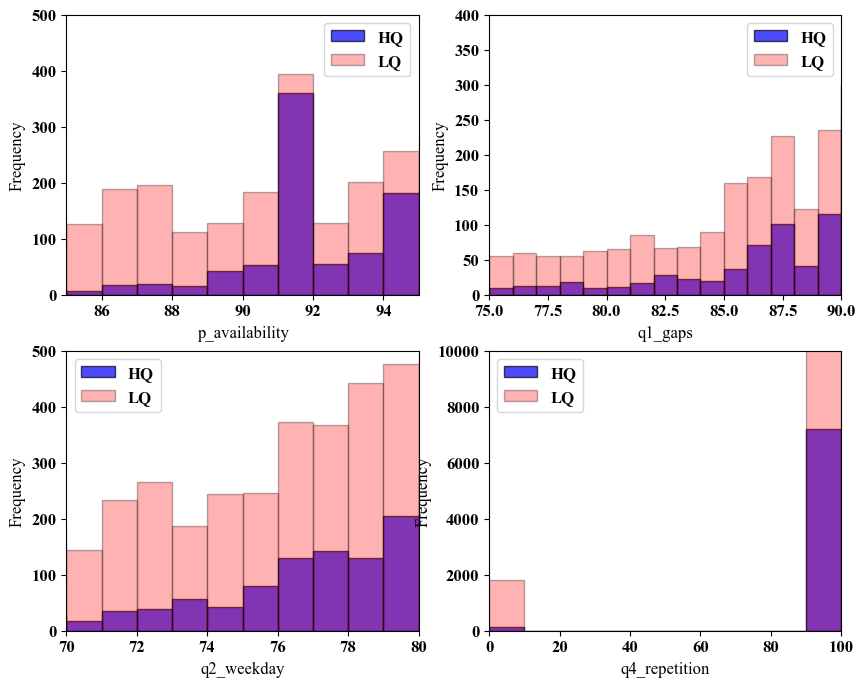

In [23]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

variable = 'p_availability' 
df_hq = df_compare[df_compare['visual_quality'] == 'HQ']
df_lq = df_compare[df_compare['visual_quality'] == 'LQ']
p_availability_hq = df_hq[variable].mean()
p_availability_lq = df_lq[variable].mean()
# Determine the bin width
bin_width = 1  # Adjust as needed
# Calculate bin edges
data_min = math.floor(min(df_hq[variable].min(), df_lq[variable].min())/10)*10
data_max = max(df_hq[variable].max(), df_lq[variable].max())
bins = np.arange(data_min, data_max + bin_width, bin_width)

# Plot data on each subplot
axs[0, 0].hist(df_hq[variable], bins=bins, alpha=0.7, label='HQ', color='blue', edgecolor='black')
axs[0, 0].hist(df_lq[variable], bins=bins, alpha=0.3, label='LQ', color='red', edgecolor='black')
axs[0, 0].set_xlim(85, 95)
axs[0, 0].set_ylim(0, 500)

axs[0, 0].legend()
axs[0, 0].set_xlabel(variable)
axs[0, 0].set_ylabel('Frequency')

variable = 'q1_gaps'
df_hq = df_compare[df_compare['visual_quality'] == 'HQ']
df_lq = df_compare[df_compare['visual_quality'] == 'LQ']
p_availability_hq = df_hq[variable].mean()
p_availability_lq = df_lq[variable].mean()
# Determine the bin width
bin_width = 1  # Adjust as needed
# Calculate bin edges
data_min = math.floor(min(df_hq[variable].min(), df_lq[variable].min())/10)*10
data_max = max(df_hq[variable].max(), df_lq[variable].max())
bins = np.arange(data_min, data_max + bin_width, bin_width)

# Plot data on each subplot
axs[0, 1].hist(df_hq[variable], bins=bins, alpha=0.7, label='HQ', color='blue', edgecolor='black')
axs[0, 1].hist(df_lq[variable], bins=bins, alpha=0.3, label='LQ', color='red', edgecolor='black')
axs[0, 1].set_xlim(75, 90)
axs[0, 1].set_ylim(0, 400)

axs[0, 1].legend()
axs[0, 1].set_xlabel(variable)
axs[0, 1].set_ylabel('Frequency')


variable = 'q2_weekday'
df_hq = df_compare[df_compare['visual_quality'] == 'HQ']
df_lq = df_compare[df_compare['visual_quality'] == 'LQ']
p_availability_hq = df_hq[variable].mean()
p_availability_lq = df_lq[variable].mean()
# Determine the bin width
bin_width = 1  # Adjust as needed
# Calculate bin edges
data_min = math.floor(min(df_hq[variable].min(), df_lq[variable].min())/10)*10
data_max = max(df_hq[variable].max(), df_lq[variable].max())
bins = np.arange(data_min, data_max + bin_width, bin_width)

# Plot data on each subplot
axs[1, 0].hist(df_hq[variable], bins=bins, alpha=0.7, label='HQ', color='blue', edgecolor='black')
axs[1, 0].hist(df_lq[variable], bins=bins, alpha=0.3, label='LQ', color='red', edgecolor='black')
axs[1, 0].set_xlim(70, 80)
axs[1, 0].set_ylim(0, 500)

axs[1, 0].legend()
axs[1, 0].set_xlabel(variable)
axs[1, 0].set_ylabel('Frequency')

variable = 'q4_repetition'
df_hq = df_compare[df_compare['visual_quality'] == 'HQ']
df_lq = df_compare[df_compare['visual_quality'] == 'LQ']
p_availability_hq = df_hq[variable].mean()
p_availability_lq = df_lq[variable].mean()
# Determine the bin width
bin_width = 10  # Adjust as needed
# Calculate bin edges
data_min = math.floor(min(df_hq[variable].min(), df_lq[variable].min())/10)*10
data_max = max(df_hq[variable].max(), df_lq[variable].max())
bins = np.arange(data_min, data_max + bin_width, bin_width)

# Plot data on each subplot
axs[1, 1].hist(df_hq[variable], bins=bins, alpha=0.7, label='HQ', color='blue', edgecolor='black')
axs[1, 1].hist(df_lq[variable], bins=bins, alpha=0.3, label='LQ', color='red', edgecolor='black')
axs[1, 1].set_xlim(0, 100)
axs[1, 1].set_ylim(0, 10000)

axs[1, 1].legend()
axs[1, 1].set_xlabel(variable)
axs[1, 1].set_ylabel('Frequency')

In [15]:
# Example confusion matrix data (replace this with your actual data)
actual = np.array(df_compare['visual_quality'].values.tolist())
predicted = np.array(df_compare['absolute_quality'].values.tolist())

# Calculate confusion matrix
confusion_matrix = metrics.confusion_matrix(actual, predicted)

# Normalize to percentages
row_sums = confusion_matrix.sum(axis=1)
row_sums[row_sums == 0] = 1  # Avoid division by zero
confusion_matrix_percentage = confusion_matrix.astype('float') / row_sums[:, np.newaxis] * 100
confusion_matrix_percentage

array([[91.00068074,  8.99931926],
       [19.11459684, 80.88540316]])

In [16]:
TP, FN = confusion_matrix[0, 0], confusion_matrix[0, 1]
FP, TN = confusion_matrix[1, 0], confusion_matrix[1, 1]

precision = TP / (TP + FP)
accuracy = (TP + TN) / (TP + TN + FP + FN)
recall = TP / (TP + FN)

print("Precision:", precision)
print("Accuracy:", accuracy)
print("Recall:", recall)

Precision: 0.6938648396138275
Accuracy: 0.8414789443639398
Recall: 0.9100068073519401


In [17]:
mc00 = ("("+str(round(confusion_matrix_percentage[0][0], 1))+"%)")
mc01 = ("("+str(round(confusion_matrix_percentage[0][1], 1))+"%)")
mc10 = ("("+str(round(confusion_matrix_percentage[1][0], 1))+"%)")
mc11 = ("("+str(round(confusion_matrix_percentage[1][1], 1))+"%)")
print(mc00, mc01, mc10, mc11)

(91.0%) (9.0%) (19.1%) (80.9%)


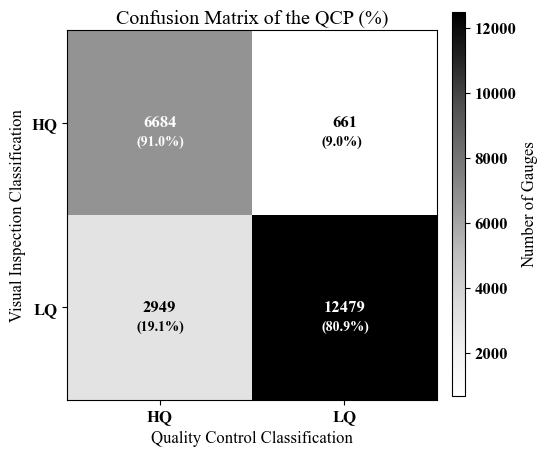

In [18]:
font = {
    'family' : 'Times New Roman',
    'weight' : 'bold',
    'size'   : '12'}
plt.rc('font', **font)
actual = np.array(df_compare['visual_quality'].values.tolist())
predicted = np.array(df_compare['absolute_quality'].values.tolist())
confusion_matrix = metrics.confusion_matrix(actual, predicted)
row_sums = confusion_matrix.sum(axis=1)
row_sums[row_sums == 0] = 1  # Avoid division by zero
class_names = ['HQ','LQ']
cm_display = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix, display_labels=class_names)
cm_display.plot(cmap='Greys', values_format='.0f', include_values=True, colorbar=False)
plt.text(-0.125, 0.125, mc00, fontsize=10, color = 'white')
plt.text(0.875, 0.125, mc01, fontsize=10)
plt.text(-0.125, 1.125, mc10, fontsize=10)
plt.text(0.875, 1.125, mc11, fontsize=10, color = 'white')
plt.ylabel('Visual Inspection Classification')
plt.xlabel('Quality Control Classification')
plt.title('Confusion Matrix of the QCP (%)', pad = 5)
fig = plt.gcf()
cax = fig.add_axes([0.825, 0.1175, 0.02, 0.8])  # [left, bottom, width, height]
cbar = plt.colorbar(cm_display.im_, cax=cax)
cbar.set_label('Number of Gauges')
plt.show()
plt.close()

In [19]:
count_pivot = df_compare.pivot_table(index='quality_label', columns='visual_quality', aggfunc='size', fill_value=0)
count_pivot.reset_index(drop = False, inplace = True)
count_pivot

visual_quality,quality_label,HQ,LQ
0,High Quality,6684,2949
1,Low Quality,661,12479
